<a href="https://colab.research.google.com/github/Harshcode20/Dog-breed-prediction/blob/master/Dog_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive') 


Mounted at /content/drive


 End-to-end Multil-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.x and TensorFlow Hub.

1. Problem
Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

2. Data
The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

4. Features
Some information about the data:

* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

In [ ]:
# Unzip the uploaded data into Google Drive
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/My Drive/Dog Vision/"

In [ ]:
# # Import TensorFlow into Colab
# import tensorflow as tf
# print("TF version:", tf.__version__)

In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub 
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available (YESSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.5.0
TF Hub version: 0.12.0
GPU available (YESSSS!!!!!)


## Getting our data ready (turning into Tensors)
With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.




In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     4f6fdc14bcf95ca24cb4eec57d1c6443  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


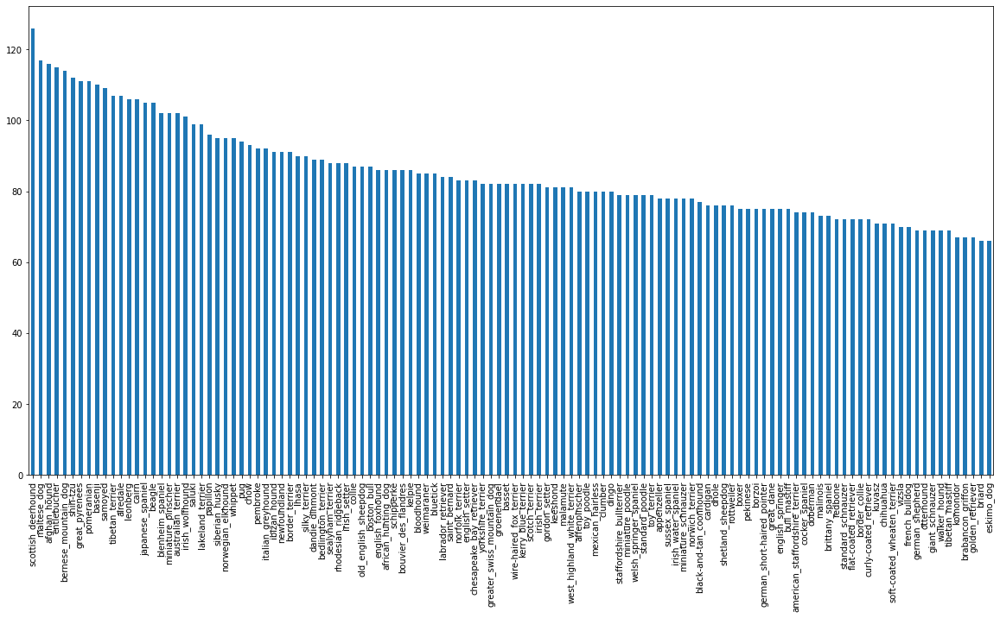

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
# What's the median number of images per class?
labels_csv["breed"].value_counts().median()

82.0

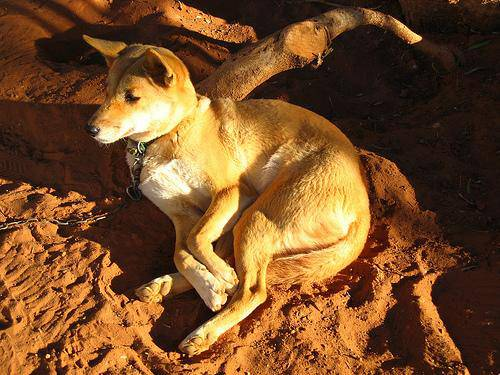

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

## Getting images and their labels
Let's get a list of all of our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID'S USING file comprehensions
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do no match actual amount of files, check the target directory.")

Filenames match actual amount of files!!! Proceed.


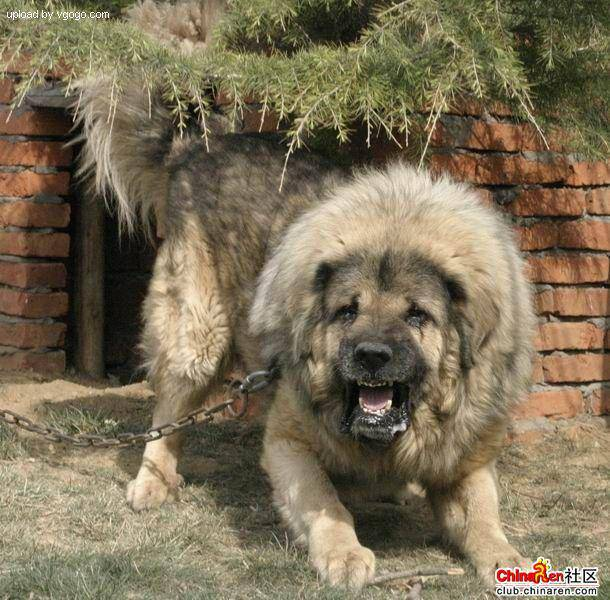

In [ ]:



# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy() 
# labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:

len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
len(labels)

10222

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:

len(boolean_labels)

10222

In [ ]:
#Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:

filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']


## Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222


We're going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a gaze at the training data
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 


## Preprocessing Images (turning images into Tensors)
To preprocess our images into Tensors we're going to write a function which does a few things:

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, image
3. Turn our image (a jpg) into Tensors
4. Normalize our image (convert color channel values from from 0-255 to 0-1).
5. Resize the image to be a shape of (224, 224)
6. Return the modified image

Before we do, let's see what importing an image looks like.

In [ ]:

# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

Color Channel--> Every image is made up of red, green and blue pixels.
The range of pixels is from 0 to 255

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
# Our image is in the form of numpy array
# Let's convert it into tensors
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's make a functioon to preprocess them.

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, image
3. Turn our image (a jpg) into Tensors
4. Normalize our image (convert color channel values from from 0-255 to 0-1).
5. Resize the image to be a shape of (224, 224)
6. Return the modified image

Before we do, let's see what importing an image looks like.

In [ ]:
# Define image size

IMG_SIZE = 224  

# Create a function for preprocessing images
def process_image(image_path, img_size = IMG_SIZE):
  """

  Takes an image file path and turns the image into a Tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpg image into numerical Tensor with 3 colour channels (Red, green and blue
  image = tf.image.decode_jpeg(image, channels = 3)
  # Convert the colour channel values from 0-255 to 0-1
 
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size
  image = tf.image.resize(image, size =[IMG_SIZE, IMG_SIZE])

  return image


Batch: A small portion of data(32 images) and we are going to calculate on those 32 images at one time and then the next 32 in another session.

## Turning our data into batches

Why turn our data into batches?

Let's say you are trying to process 10,000+ images in one go ... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time(you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need oiur data in the form of Tensor tuples which look like this:`(image, label)`.

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  process the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
# (process_image(filenames[42]), boolean_labels[42])
(process_image(X[42]), tf.constant(y[42]))  
# Image is in the form of Tensor but the label is not, so we are going to convert it into tensor. 

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

A lot of machine learning is all about preprocessing your data into a format that fits into your machine learning model.

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make function to turn all of our data (`X` & `y`) into batches. 

In [ ]:
# define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
# We are going to convert training set into training batch, validation set into validation batch and test set into test batch.
def create_data_batches(X, y= None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validationdata.
  Also accepts test data as input (no labels)
  """
  # If the data is a test dataset, we probably don't have labels.
  if test_data:
    print("Creating test data batches..")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths(no labels)
    # The above function creates a dataset from the tensor slices and  converts X into tensors.
    data_batch =  data.map(process_image).batch(BATCH_SIZE )
    return data_batch
    #Take this data (tensorflow dataset) made of X and then map process_images function and then turn it into a batch of BATCH_SIZE

  # If the data is a valid dataset, we don't need to shuffle it.
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),# filepaths
                                               tf.constant(y)))# labels
    # As our validation set has labels, we have passed a tuple of filepaths and labels.
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:#training data
    print("Creating training data batches..")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepathss
                                              tf.constant(y))) # labels
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images.
    data = data.shuffle(buffer_size = len(X))

    # Create (image, label) tuples (this alsoturns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch


In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches..
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

**filepaths**
* None= BATCH_SIZE
* shape = 224, 224
* 3 = colour channels

**label**
* 120 = 120 different dog breeds (rememeber:))


### Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them.

In [ ]:
unique_breeds[y[1].argmax()]



'dingo'

In [ ]:
import matplotlib.pyplot as plt


# Create a function for viewing images in a data batch

def show_25_images(images, labels):

  """
  Displays a plot of 25 images and their labels from a data batch.
  """

  # Setup the figure
  plt.figure(figsize= (10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)# i+1 is index
    # Display an image
    plt.imshow(images[i])
    # Add image label(breed) as the title
    plt.title(unique_breeds[labels[i].argmax()])# checks the index which is 1 and then at that index returns the breed of dog:)
    # Turn the grid lines off
    plt.axis("off")  


In [ ]:
# Since our data is in batch, we need to unbatch it so as to visualize it.
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

# since the train data is in batch, we need to turn it into an iterater.
# Through next() function, the first batch will be unbatched.

(array([[[[2.45553240e-01, 2.10259125e-01, 1.43592447e-01],
          [2.54306734e-01, 2.19012618e-01, 1.52345940e-01],
          [2.55779445e-01, 2.20485315e-01, 1.53818637e-01],
          ...,
          [2.62745112e-01, 2.27450997e-01, 1.60784319e-01],
          [2.54901975e-01, 2.28046268e-01, 1.51750639e-01],
          [2.54901975e-01, 2.31372565e-01, 1.45098045e-01]],
 
         [[2.46652186e-01, 2.11358070e-01, 1.44691393e-01],
          [2.57169127e-01, 2.21875012e-01, 1.55208334e-01],
          [2.58508414e-01, 2.23214298e-01, 1.56547621e-01],
          ...,
          [2.62745112e-01, 2.27450997e-01, 1.60784319e-01],
          [2.54901975e-01, 2.28046268e-01, 1.51750639e-01],
          [2.54901975e-01, 2.31372565e-01, 1.45098045e-01]],
 
         [[2.49800801e-01, 2.14506686e-01, 1.47840008e-01],
          [2.58228302e-01, 2.22934186e-01, 1.56267509e-01],
          [2.59604394e-01, 2.24310294e-01, 1.57643616e-01],
          ...,
          [2.62745112e-01, 2.27450997e-01, 1.6078

In [ ]:
len(train_images), len(train_labels)

(32, 32)

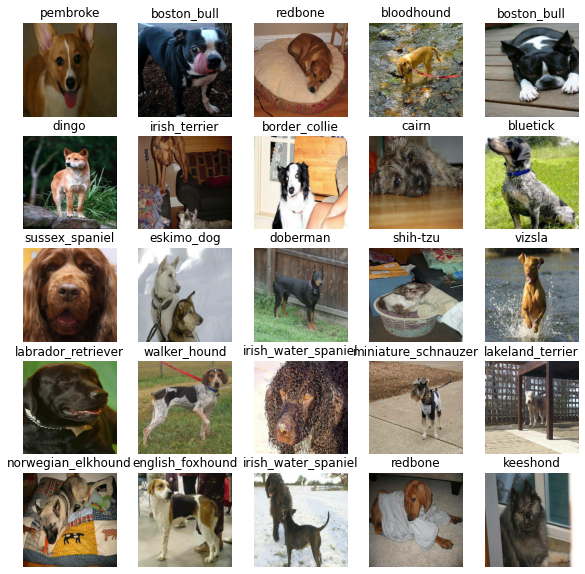

In [ ]:
# Now, let's visualize the data in training batch
show_25_images(train_images, train_labels)

Everytime you run the above cell, you will get different images, because it's training data(everytime you call the training data, it shuffles).

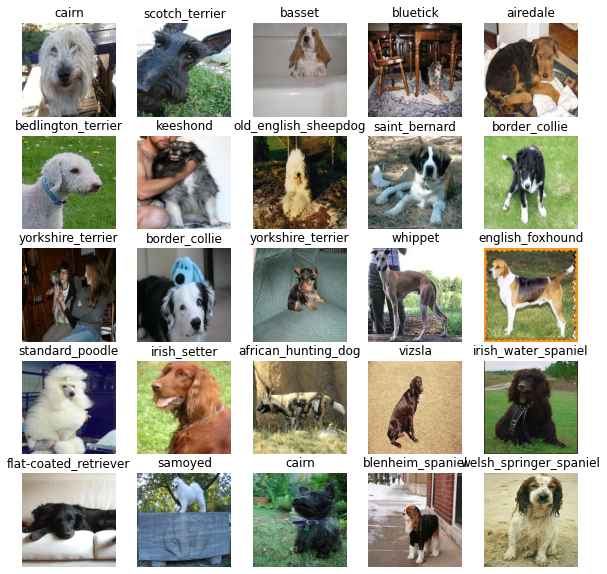

In [ ]:
#Now, let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build our model, there are a few things we need to define.

* The input shape ( our images shape, in form of tensors) to our model.
* The output shape(image labels, in form of tensors) of our model.
* URL of the machine learning model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup the output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"


*TensorFlow* Hub is a library for reusable machine learning model.

Now we've got our inputs, outputs and model ready to go.
Let's put them together into Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in a sequential fashion (
( do this first, then this, then that).
* Compiles the model (says how it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting)
) 
* Returns the model.

All of these can be found here:  https://www.tensorflow.org/guide/keras/sequential_model

In [ ]:
# Create a function which builds a keras model
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers( Instantiating the model)
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                                activation = "softmax") # layer 2 (Output layer)
  ])

  # Compile the model (Putting the model together essentially how the model is goi98ng to lear)
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE) # Batch input size

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


Setting up the deep learning model in a nutshell:-
* We're using `keras` to build our deep learning model.
* It's going to run in sequential fashion(Linear satck of layers).
* **Linear Stack of Layers:** A stack of layers that's gonna take some sort of input, find patterns in them and then, have some sort  of output.
* `hub.KerasLayer(MODEL_URL)`: Telling tensorflow hub to ccreate a keras layer of model url.
* We want our outputs to be in the shape of 120, because that's how many labels we have.
* We have an input of an image, MobileNetV is going to go through it and then, condense it into one long array of numbers (1280 long).
* The first layer, model URL, is a MobileNetV architechture which is being implemented for us and within that MobileNetV2 architecture, there is going to be a series of convolutions which are going to find patterns in our input images and learn the features of those image(vertical line, circles in an image).
* So this is the beautiful thing about transfer learning that all the steps have already been implemented for us.
* Once it has gone through the architecture, it's going to ouput a single array of size 1280 with all of the pattrnns it's learned in an image..
* All we have to do is say, hey, actually instead of that 1280, we want our output to be in the shape of however many labels we have.
* After applying softmax (dense neural network layer), each component(patterns) will be in the interval(0, 1)  and the components(array elements 120) will add up to 1 and the highest value is our label.
* `Binary Classification`: Activation(Sigmoid), Loss:BinaryCrossentropy.
* `Multi-class Classification`: Activation(Softmax), Loss: categorical Crossentropy                                                                                   


Compiling the deep learning model in a nutshell:
* Let's say you are at a hill descending championship.You are good at getting down the hill.This time blindfolded:)
* `loss` is the height of the hill. Our goal is to minimize it, getting it to 0 a.k.a getting to the bottom of the hill.
* This means the model is learning perfectly.
* so when it's going through the training set, the `loss` is the measure of how well the model is guessing. So when it's trying to make predictions whilst it's learning:-
    * The higher the loss, the worse the model is learning the patterns.
    * The lower the loss, the better the model is learning patterns.
* So your friend Adam who is giving you instructions on how to get down the hill is the `optimizer`. He is the one telling you how to navigatethe hill aka lower the loss function.
* `Adam`: A general optimizer which performs well on general models. 
* `metrics` is your judge down the hill, telling you how good you performed. In our case, it's giving us the accuracy of how well our model is predicting the correct image labels.
    

Summary:-
* params -->  5432713  (No. of patterns that MobileNetV2 has found within 'imagenet' dataset which contains more than 14 million images.)
* Now, we get to utilize those patterns in our problem without having to find them from scratch and performng various numerical computation which is way  expensive, we can train our own 120240 parameters.

## Creating Callbacks

Callbacks are helper functions a model can use during  training to do such things as save its progress, check it's progress or stop training early if a model stops improving.

We'll create two callbacks, one for Tensorboard which helps track our model progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback
It's like a dashboard which will keep us updated about the loss function and the accuracy of our model while running.

To setup a TensorBoard callback, we need to do three things:
1. Load the TensorBoard notebook extension ✅
2. Create a Tensorboard callback which is able to save logs9 how our model is doing during training) to a directory and pass it to our model's `fit()` function ✅.
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).


In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
# we want to track each experiment and one of the ways to track an experiment is by the time you ran that experiment.

import datetime

# Create a function to build a Tensorboard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs.
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                    # Make it so the logs get tracked whenever we run an experiment
                    datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  # everytime we fit our model, we want to create some training logs for current date and time.
  return tf.keras.callbacks.TensorBoard(logdir)

The log directory(logdir), everytime we call the function, it's gonna create a path in logs with the name appended to it of the current datetime.

### Early Stopping Callback (To prevent overfitting)

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metrics stops improving.
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor ="val_accuracy",
                                                  patience = 3)# by default, EarlyStopping() uses val_loss but we are going to use val_acc for now.
                                                  #Number of epochs with no improvement after which training will be stopped.


## Training a model ( on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.


Epochs: How many passes( our model trying to find patterns in each dog image and see which pattern relates to each label) of data we'd like our model to do.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

* One epoch is going to give our model a single chance to look at all of the training data and then, validating it from there. 100 epochs is going to give our model 100 chances to look at the training data and find patterns in them.
* Pass: We are going to pass our training images to our model. It's going to go through the model layers.And then our model, as it learns patterns, is going to make guesses on which label belongs to which image.
* The worse the guess is, the higher the loss will be.
* This is where Adam comes in, telling our model how it can improve it's guesses  with each epoch.
* and then, we are going to see how our model is doing on accuracy level.

In [ ]:
# Check to make sure we're still running on a GPU.
print("GPU", "available (YESSSS!!!!)" if tf.config.list_physical_devices("GPU") else "NOT AVAILABLE :(")

GPU available (YESSSS!!!!)


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use.
* Return the model.

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new  TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,# How many times our model is allowed to look at the training data before it stops.
            validation_data = val_data,
            validation_freq = 1,# How often we want to test the patterns that our model has found on our validation set.We have set it to 1 as we wanted to test its patterns it's found.
            callbacks = [tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
# fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 165s 5s/step - loss: 4.5344 - accuracy: 0.0925 - val_loss: 3.3728 - val_accuracy: 0.2550
Epoch 2/100
25/25 [==============================] - 3s 119ms/step - loss: 1.6357 - accuracy: 0.7013 - val_loss: 2.2098 - val_accuracy: 0.4850
Epoch 3/100
25/25 [==============================] - 3s 117ms/step - loss: 0.5739 - accuracy: 0.9413 - val_loss: 1.6808 - val_accuracy: 0.5950
Epoch 4/100
25/25 [==============================] - 3s 126ms/step - loss: 0.2556 - accuracy: 0.9887 - val_loss: 1.5124 - val_accuracy: 0.6200
Epoch 5/100
25/25 [==============================] - 4s 152ms/step - loss: 0.1517 - accuracy: 0.9975 - val_loss: 1.4181 - val_accuracy: 0.6350
Epoch 6/100
25/25 [==============================] - 4s 149ms/step - loss: 0.1017 - accuracy: 0.9987 - val_loss: 1.3817 - val_accuracy: 0.6300
Epoch 7/100
25/25 [==============================]

**Question:** It looks like our model is overfitting because it's performig far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learning!!!

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the log directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model


In [ ]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose = 1)# verbose is just going to say,"Hey,when you are making predictions, show me your progress".
predictions

7/7 [==============================] - 1s 86ms/step


array([[3.31960665e-03, 3.70489033e-05, 1.36303692e-03, ...,
        5.11978229e-04, 2.99436324e-05, 1.16990798e-03],
       [1.42413715e-04, 1.39033815e-04, 1.40828337e-03, ...,
        8.04232084e-04, 2.16840854e-04, 2.62257217e-05],
       [2.80874199e-04, 2.51400867e-04, 7.60268404e-06, ...,
        8.97213886e-06, 3.40121842e-05, 8.33316182e-04],
       ...,
       [2.52878544e-06, 4.65479425e-05, 1.42687868e-05, ...,
        1.52809407e-05, 8.74376783e-05, 3.76916228e-06],
       [1.43394701e-03, 2.21339396e-05, 5.44144714e-05, ...,
        3.80508747e-04, 1.72230488e-04, 1.94245239e-03],
       [1.16781994e-04, 5.71413193e-06, 7.74963875e-04, ...,
        3.57940770e-03, 8.69414143e-05, 2.54443985e-05]], dtype=float32)

It's the nature of predict function to predict only on the features (images from the val_data), ten it's going to compare those predictions to the labels from val_data.

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
predictions.shape

(200, 120)

There are 200 arrays with 120 values(probability of the image being equal to a certain breed(label)) in each array. The highest value in the label of each array is more likely to correspond to the label associated with the image. 

In [ ]:
# First prediction
index = 0
print(predictions[index])
print(f"Max value (probability of prediction):{np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max Index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")



[3.31960665e-03 3.70489033e-05 1.36303692e-03 4.36530718e-05
 5.85037749e-04 2.28370573e-05 2.19104122e-02 1.03542104e-03
 3.27416637e-04 2.54695583e-03 1.99823640e-04 5.06709097e-04
 2.35055719e-04 2.16208224e-04 1.61955133e-04 1.54269554e-04
 1.80417002e-04 1.32091939e-01 5.87571731e-06 1.02521881e-04
 3.37388483e-04 1.83436772e-04 3.61289021e-05 1.07409135e-02
 1.43695506e-05 3.11237469e-04 2.07153738e-01 4.59755429e-05
 3.98864417e-04 2.83381785e-04 4.17956093e-04 1.74831320e-03
 4.34324262e-04 4.03016275e-05 6.67642016e-05 2.03698948e-02
 7.95210417e-06 1.24722789e-03 2.75794209e-05 2.03521355e-04
 4.93496889e-04 3.79425073e-05 4.35794464e-05 7.23853664e-05
 2.74953563e-05 1.42348334e-04 5.69412332e-05 2.45970645e-04
 1.99281640e-04 1.41681245e-04 2.39795903e-04 1.76085268e-05
 6.87475782e-04 1.20730263e-04 1.30591492e-04 2.62295234e-05
 7.56960362e-05 1.75170368e-03 7.02914491e-04 1.67140141e-01
 6.82508689e-05 6.34947937e-05 1.73929788e-03 1.11976362e-04
 1.69644321e-04 1.478658

**Max value (probability of prediction):** The closer this value is to 1, the more confident our model is about a certain prediction.

In [ ]:
unique_breeds[113]

'walker_hound'

Probabilities of prediction are also known as confidence intervals. 

Having the above functionality is great but we wnat to be able to do it on scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence intervals.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

In [ ]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
# Create a function to unbatch a batch dataset

def unbatchify(batch_data):

  """
  Takes a batch dataset of (image, label) Tensors and returns separate arrays of images and labels
  """

  images = []
  labels = []
  # loop through unbatched data
  for image, label in batch_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)]) 
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

  

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[9])

'affenpinscher'

In [ ]:
get_pred_label(predictions[9])

'collie'

The predicted label for the image at index 0 in validation set is not same as the actual label of the same image.

Now we've got ways to get:
* Prediction labels
* Validation labels( truth labels)
* validation images

Let's make some function to make these all a bit more visual.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.✅
* Convert the prediction probabilities to a predicted label.✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.✅

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image) # plots an image
  plt.xticks([])
  plt.yticks([])

  # Change he colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"


  # Change plot title to be predicted, probability of prediction and  truth label
  plt.title("{} {:2.0f}% {}".format(pred_label, 
                                     np.max(pred_prob)*100,
                                     true_label),
                                     color = color) 
  # reducing the decimal points to make it look less subtle

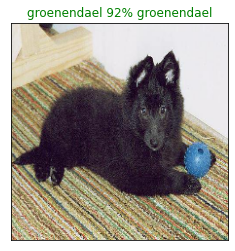

In [ ]:
plot_pred(prediction_probabilities = predictions, 
          labels= val_labels,
          images= val_images,
          n = 77)

Now we've got one function to visualize our model's top prediction, let's make another to view our model's top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer✅
* Find the prediction using `get_pred_label()`✅
* Find the top 10:
  * Prediction probabilities indexes✅
  * Prediction probabilities values✅
  * Prediction labels✅
* Plot the top 10 prediction probability values and labels, coloring the true label green.✅


In [ ]:

def plot_pred_conf(prediction_probabilities, labels, n=1):
  """

  Plus the top 10 highest confidences along with the truth label for sample n
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 predictition confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")
  
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")
  
  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):# If true label is present in the top 10 pred labels
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
    # Index of top 10 pred labels where it is equal to the true label
  else:
    pass

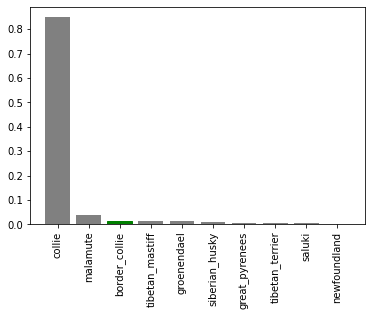

In [ ]:
plot_pred_conf(prediction_probabilities= predictions,
               labels = val_labels,
               n=9)

In [ ]:
#top_10_pred_values=predictions[0][predictions[0].argsort()[-10:][::-1]] # Top 10 prediction indexs(where the top 10 highest values are present) in descending order

In [ ]:
#top_10_pred_labels = unique_breeds[predictions[0].argsort()[-10:][::-1]]

In [ ]:
#np.arange(len(top_10_pred_labels))

Now we've got some functions to help us visualize and evaluate our model, let's check out a few!


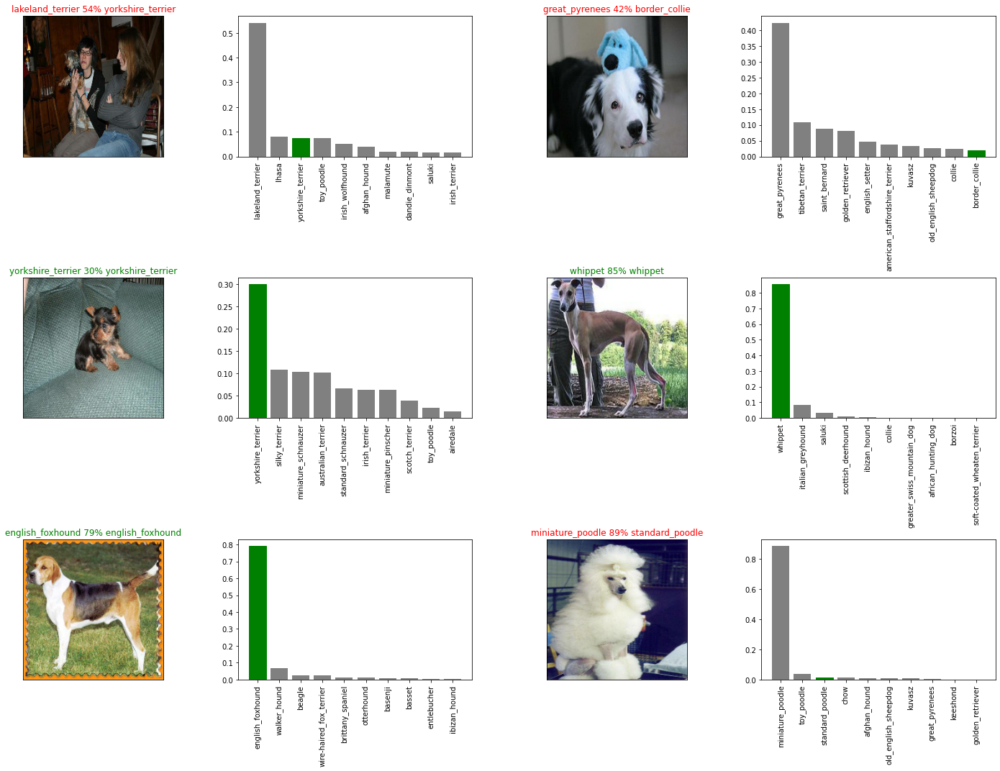

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize = (10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols, 2*i+1)# for the space between two axes
  plot_pred(prediction_probabilities= predictions,
            labels = val_labels,
            images = val_images,
            n = i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities= predictions,
                 labels = val_labels,
                 n = i+i_multiplier)
plt.tight_layout(h_pad= 1.0) # Take the padding alog the horizontal axis and just give us a bit more space
plt.show()

**Challenge:** How would you create a confusion matrix with a model's predictions and true label?

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def  save_model(model, suffix = None):# suffix is used to let people know the no. of images our model was trained on
  """
  Saves a given model in a model's directory and appends a suffix (string)
  """
  # create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to:{model_path}....")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer": hub.KerasLayer})
  # Since we are using hub, we need to pass custom_objects dictionary to the above code
  # Hey, we haveseen an irregular layer, a layer you wouldn't have seen before in our model
  
  return model

Now we've got functions to save and load a trained model, let's make sure they work.

In [ ]:
# Save our model trained on 1000 images
save_model(model, "suffix= 1000-images-mobilenetv2-Adam")

Saving model to:drive/MyDrive/Dog Vision/models/20210802-17471627926438-suffix= 1000-images-mobilenetv2-Adam.h5....


'drive/MyDrive/Dog Vision/models/20210802-17471627926438-suffix= 1000-images-mobilenetv2-Adam.h5'

In [ ]:
# load atrained model
loaded_1000_image_model = load_model("drive/MyDrive/Dog Vision/models/20210802-05261627881986-suffix= 1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20210802-05261627881986-suffix= 1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the presaved model
model.evaluate(val_data)

7/7 [==============================] - 1s 86ms/step - loss: 1.2181 - accuracy: 0.6800


[1.218125581741333, 0.6800000071525574]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 86ms/step - loss: 1.3789 - accuracy: 0.6450


[1.3789368867874146, 0.6449999809265137]

## Training a big dog model 🐶 (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a databatch with the full dataset
full_data = create_data_batches(X, y)

Creating training data batches..


In [ ]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()# TEnsorBoard helps us to track the performance of our model and compare it to others
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience = 3) # after three epochs, if no progress can be seen in the model, EarlyStopping() will stop the model.

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the model to the data
full_model.fit(x = full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

In [ ]:
save_model(full_model, suffix = "full-image-set-mobilenetv2-Adam")

In [ ]:
loaded_full_model = load_model("drive/MyDrive/Dog Vision/models/20210802-05421627882964-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20210802-05421627882964-full-image-set-mobilenetv2-Adam.h5


In [ ]:
len(X)

10222

## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it in the same format.

Luckily, we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll :
* Get the test image filenames using list comprehension✅
* Convert the filenames into test data batches using `create_data_batches` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).✅
* Make a predictions array by passing the test batches to the predict() method on our model.✅


In [ ]:
# load test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e751e319cfdc9912ae2e5da2a9b053e0.jpg',
 'drive/MyDrive/Dog Vision/test/dfdeddf3da8d52c211620eaabd82b773.jpg',
 'drive/MyDrive/Dog Vision/test/deac194013c246095f0e88cd8b6b90d2.jpg',
 'drive/MyDrive/Dog Vision/test/e64b53f9c0fefdd97e269c55335418e7.jpg',
 'drive/MyDrive/Dog Vision/test/e7afcce6e45858fc3b294cc5c0b15a53.jpg',
 'drive/MyDrive/Dog Vision/test/e312dda8d35118c40880c0f331c09509.jpg',
 'drive/MyDrive/Dog Vision/test/dcae38083c0e6a8afe15b6f0703bdefa.jpg',
 'drive/MyDrive/Dog Vision/test/e000b7b3b37659a771d0151dc453bc0a.jpg',
 'drive/MyDrive/Dog Vision/test/e29d2336a8559d96973c874c9c6c17c6.jpg',
 'drive/MyDrive/Dog Vision/test/deec3d206b0f5c927c86ed1782990961.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data = True)

Creating test data batches..


In [ ]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about an ~1hour)

In [ ]:
# Make predictions on test data using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                              verbose = 1)

324/324 [==============================] - 693s 2s/step


In [ ]:
# Save predictions ( NumPy Array) to csv file (for access, later)
np.savetxt("drive/MyDrive/Dog Vision/preds_array1.csv",test_predictions, delimiter = ",")

In [ ]:
# Load predictions  (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[3.42956810e-13, 2.70145668e-12, 3.33102449e-14, ...,
        2.64791512e-14, 1.69943107e-13, 9.06816194e-14],
       [2.87965897e-12, 2.41989467e-11, 4.10564721e-10, ...,
        2.20877986e-11, 3.22705751e-09, 1.71412710e-11],
       [2.26920029e-08, 2.19249131e-07, 3.65060657e-08, ...,
        1.16985063e-07, 7.13122019e-04, 6.02139880e-06],
       ...,
       [8.69683058e-12, 2.52490932e-12, 2.41274719e-13, ...,
        2.50528439e-12, 1.24827093e-10, 3.16855465e-11],
       [1.59990520e-07, 2.26055139e-08, 1.21466329e-07, ...,
        1.43606114e-08, 1.50155638e-05, 3.09481507e-08],
       [6.86242946e-13, 3.57509226e-12, 6.41039045e-12, ...,
        4.99125775e-11, 2.80019687e-13, 1.31021194e-10]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test predictions for Kaggle

Looking at the Kaggle sample submission, we find that  it wants our model's prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

So to get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for dog breed
* Add data to the ID Column by extracting the test image ID's from their filepaths
* Add data (prediction probabilities) to each of the dog breed columns
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns =["id"]+ list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e751e319cfdc9912ae2e5da2a9b053e0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,dfdeddf3da8d52c211620eaabd82b773,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,deac194013c246095f0e88cd8b6b90d2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e64b53f9c0fefdd97e269c55335418e7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e7afcce6e45858fc3b294cc5c0b15a53,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e751e319cfdc9912ae2e5da2a9b053e0,3.42957e-13,2.70146e-12,3.33102e-14,1.12248e-10,1.83927e-13,6.21441e-12,5.86116e-12,9.24395e-13,2.63894e-10,1.26546e-10,3.16583e-14,1.37092e-11,4.85026e-14,2.85411e-09,4.82114e-12,2.40526e-14,2.35326e-14,6.59566e-14,3.37952e-13,2.02935e-13,6.00896e-15,1.14431e-13,1.67175e-13,3.11897e-14,7.16781e-09,1.45671e-12,3.73954e-12,1.12502e-12,1.11339e-13,6.16099e-14,5.21485e-11,1.36705e-10,2.67824e-10,9.44118e-11,2.04312e-13,1.0095e-12,3.51391e-11,1.53703e-13,3.28017e-12,...,3.12796e-13,2.00989e-12,1.97953e-12,1.29776e-11,7.91073e-12,5.33056e-14,1.57307e-12,2.08318e-14,1.84279e-14,2.65519e-13,1.99013e-15,2.6004e-15,6.30364e-11,1.31416e-13,1.94813e-13,1.19147e-14,1.15386e-11,4.10725e-14,2.90141e-15,6.8056e-12,5.79589e-13,1.67448e-13,3.28788e-12,3.53725e-13,6.84328e-15,8.1446e-12,3.56825e-12,8.9973e-11,4.95758e-13,8.76802e-14,3.56377e-13,2.53133e-15,3.87038e-13,4.11814e-13,4.81524e-15,1,1.66409e-12,2.64792e-14,1.69943e-13,9.06816e-14
1,dfdeddf3da8d52c211620eaabd82b773,2.87966e-12,2.41989e-11,4.10565e-10,4.45204e-12,9.30096e-10,6.18728e-09,6.0241e-09,0.000258258,8.77624e-12,5.0059e-08,1.31869e-09,5.09133e-14,1.27262e-07,9.88985e-11,6.54506e-09,4.52255e-11,2.67342e-10,7.59344e-10,2.30468e-12,2.0668e-08,5.39279e-11,4.9519e-12,1.25537e-10,1.75353e-10,2.54099e-11,1.57065e-08,3.68393e-11,1.07924e-07,6.84343e-10,5.4921e-08,6.54102e-08,1.62478e-11,1.36226e-10,6.17109e-08,1.67502e-11,4.52222e-09,1.90193e-08,0.998022,4.36145e-11,...,6.04107e-09,3.70854e-08,5.69347e-12,4.82847e-13,2.24525e-09,4.09707e-11,1.38135e-06,7.43626e-13,4.16052e-10,2.64277e-05,1.32181e-08,3.04523e-12,8.82277e-11,9.18765e-09,4.35401e-10,3.13374e-09,5.02423e-10,4.19185e-12,1.33751e-11,6.5634e-12,7.94752e-09,2.05318e-07,4.11465e-09,2.84477e-09,8.95818e-08,1.39392e-08,4.73136e-12,6.05044e-11,1.25983e-08,9.71006e-11,9.51028e-10,1.1585e-07,1.14188e-11,4.44535e-12,1.5044e-09,6.47989e-11,1.97002e-10,2.20878e-11,3.22706e-09,1.71413e-11
2,deac194013c246095f0e88cd8b6b90d2,2.2692e-08,2.19249e-07,3.65061e-08,9.85884e-08,7.25988e-08,7.92722e-08,2.26781e-05,2.89565e-09,3.38199e-07,1.00539e-08,2.37605e-06,2.78931e-08,9.32868e-08,4.44353e-09,2.23143e-09,2.55355e-09,7.64377e-09,2.61757e-08,4.16377e-09,2.41379e-10,3.86995e-09,1.94692e-07,3.81592e-07,9.48016e-08,1.70723e-08,8.89827e-10,8.80768e-09,2.39781e-09,2.64639e-10,4.32074e-08,1.13901e-09,5.05904e-06,2.775e-07,2.70675e-10,1.49546e-09,0.00134271,6.48284e-10,3.20137e-11,8.5813e-09,...,2.84363e-09,7.4599e-09,2.02797e-09,1.38575e-07,2.67675e-08,1.4565e-07,1.81666e-08,3.96328e-09,1.37111e-08,1.01998e-09,3.44608e-09,5.1081e-09,2.02764e-09,4.43905e-10,7.41177e-10,4.67851e-09,5.64178e-06,4.9356e-08,0.996805,4.53721e-11,9.18896e-10,2.43906e-10,3.06331e-08,9.72e-08,5.6506e-08,2.86822e-11,0.000415685,1.11645e-07,3.93306e-09,9.42753e-09,4.10322e-07,3.48821e-08,3.10234e-08,4.5919e-10,4.33602e-09,1.81647e-09,1.18808e-06,1.16985e-

In [ ]:
# Save our predictions dataframe to csvfor submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index = False)

## Making predictions on custom image

To make predictions on custom images, we'll:
* Get the file paths of our own images.
* Turn the filepaths into data batches using `create_data_batches(``. And since our custom images won't have labels, we set the `test data` parameter to `True`.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to prediction labe;s.
* Compare the  prdicted labels to custom images.

In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog Vision/my-dog-photos/download.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/images.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/image.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data= True)


Creating test data batches..


In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['golden_retriever', 'lakeland_terrier', 'labrador_retriever']

In [ ]:
# get the custom images  (our unbatchify() function won't work since there aren't labels...maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

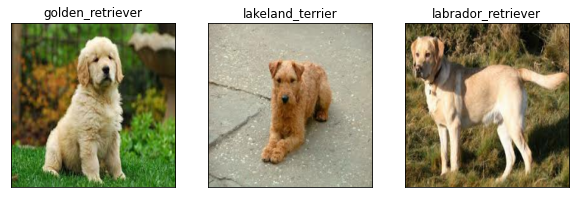

In [ ]:
# Check custom image predictions
plt.figure(figsize =(10, 10))
# For the images in custom images count them up and save the count to i save the image in custom images
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)
